<a href="https://colab.research.google.com/github/Max280201/TrafficSignCV/blob/main/TrafficSignCV_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1 Imports

In [ ]:
# install yolov7 original repository
!git clone https://github.com/WongKinYiu/yolov7 # Downloading YOLOv7 repository and installing requirements
!pip install -qr ./yolov7/requirements.txt

Cloning into 'yolov7'...
remote: Enumerating objects: 1127, done.
remote: Total 1127 (delta 0), reused 0 (delta 0), pack-reused 1127
Receiving objects: 100% (1127/1127), 69.94 MiB | 19.34 MiB/s, done.
Resolving deltas: 100% (519/519), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 5.5 MB/s eta 0:00:00


In [ ]:
import os
import sys
sys.path.append(os.path.join("./", "yolov7/"))

import argparse
import time
from pathlib import Path
import numpy as np
from PIL import Image

import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import torch.backends.cudnn as cudnn
from numpy import random

from tensorflow.keras.models import load_model

from google.colab import drive
from google.colab.patches import cv2_imshow
from models.yolo import Model
from models.experimental import attempt_load
from utils.datasets import LoadStreams, LoadImages
from utils.general import check_img_size, check_requirements, check_imshow, non_max_suppression, apply_classifier, \
    scale_coords, xyxy2xywh, strip_optimizer, set_logging, increment_path
from utils.plots import plot_one_box
from utils.torch_utils import select_device, load_classifier, time_synchronized, TracedModel

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! pip install kaggle
! mkdir -p ~/.kaggle/
# for the case, that kaggle.json is stored in the drive
! cp drive/MyDrive/kaggle.json ~/.kaggle/
# for the case, if kaggle.json is stored under the root dir
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
! kaggle datasets download -d satyarthpandey/german-traffic-sign-detection
! unzip -n -q german-traffic-sign-detection -d data_ts_detection

100% 1.61G/1.61G [00:23<00:00, 108MB/s] 
100% 1.61G/1.61G [00:23<00:00, 72.2MB/s]


# class names

In [ ]:
class_names = { 
    0:'Speed limit (20km/h)',
    1:'Speed limit (30km/h)', 
    2:'Speed limit (50km/h)', 
    3:'Speed limit (60km/h)', 
    4:'Speed limit (70km/h)', 
    5:'Speed limit (80km/h)',
    6:'End of speed limit (80km/h)',
    7:'Speed limit (100km/h)',
    8:'Speed limit (120km/h)', 
    9:'No passing', 
    10:'No passing veh over 3.5 tons', 
    11:'Right-of-way at intersection', 
    12:'Priority road', 
    13:'Yield', 
    14:'Stop',
    15:'No vehicles',
    16:'Veh > 3.5 tons prohibited', 
    17:'No entry',
    18:'General caution',
    19:'Dangerous curve left',
    20:'Dangerous curve right',
    21:'Double curve',
    22:'Bumpy road',
    23:'Slippery road',
    24:'Road narrows on the right',
    25:'Road work',
    26:'Traffic signals',
    27:'Pedestrians',
    28:'Children crossing',
    29:'Bicycles crossing',
    30:'Beware of ice/snow',
    31:'Wild animals crossing',
    32:'End speed + passing limits',
    33:'Turn right ahead', 
    34:'Turn left ahead',
    35:'Ahead only',
    36:'Go straight or right',
    37:'Go straight or left',
    38:'Keep right',
    39:'Keep left', 
    40:'Roundabout mandatory',
    41:'End of no passing',
    42:'End no passing veh > 3.5 tons', 
}

# 3 Demos

In [ ]:
IMAGE_DIR = "/content/data_ts_detection/FullIJCNN2013/FullIJCNN2013/"
images = os.listdir(IMAGE_DIR)
for image in images:
  if image.endswith('ppm'):
    im = Image.open(f"{IMAGE_DIR+image}")
    im.save(f"{IMAGE_DIR+image.split('.')[0]}.jpg")

In [ ]:
%matplotlib inline

SOURCE_YOLO = "/content/drive/MyDrive/checkpoints/best.pt"
SOURCE_CLASSIFIER = 'drive/MyDrive/traffic_sign_recogn/vgg16_model_acc_99_additional_pp_layers_model' # "/content/drive/MyDrive/checkpoints/vgg16_model_acc_99_model" 
MODEL_DETECTION = torch.hub.load(os.path.join(os.getcwd(), "yolov7"), 'custom', SOURCE_YOLO, 
                            source='local')
MODEL_RECOGNITION = load_model(SOURCE_CLASSIFIER)
SOURCE_IMAGE = IMAGE_DIR+"0000*.jpg"

/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Adding autoShape... 


In [ ]:
# %matplotlib inline

def detect(source_image, source_weights_yolo, save_img=False, source_weights_classifier=None, classify=True, \
           view_img=False, save_txt=False, imgsz=1360, trace=True, exist_ok=True, device='cpu', classes=2, \
           augment=False, project="traffic_sign_detection_cv", name="yolov7_demo",  conf_thres=0.25, iou_thres=0.45,
           agnostic_nms=False, save_conf=True, save_path="temp.jpg"):
    # source, weights, view_img, save_txt, imgsz, trace = opt.source, opt.weights, opt.view_img, opt.save_txt, opt.img_size, not opt.no_trace
    # save_img = not opt.nosave and not source.endswith('.txt')  # save inference images
    webcam = source_image.isnumeric() or source_image.endswith('.txt') or source_image.lower().startswith(
        ('rtsp://', 'rtmp://', 'http://', 'https://'))

    # Directories
    save_dir = Path(increment_path(Path(project) / name, exist_ok=exist_ok))  # increment run
    (save_dir / 'labels' if save_txt else save_dir).mkdir(parents=True, exist_ok=True)  # make dir

    # Initialize
    set_logging()
    device = select_device(device)
    half = device.type != 'cpu'  # half precision only supported on CUDA

    # Load model
    model = torch.hub.load(os.path.join(os.getcwd(), "yolov7"), 'custom', SOURCE_YOLO, 
                           source='local')
    stride = int(model.stride.max())  # model stride
    imgsz = check_img_size(imgsz, s=stride)  # check img_size

    # Second-stage classifier
    if classify:
        MODEL_RECOGNITION = load_model(source_weights_classifier)


    # Set Dataloader
    vid_path, vid_writer = None, None
    if webcam:
        view_img = check_imshow()
        cudnn.benchmark = True  # set True to speed up constant image size inference
        dataset = LoadStreams(source_image, img_size=imgsz, stride=stride)
    else:
        dataset = LoadImages(source_image, img_size=imgsz, stride=stride)

    # Get names and colors
    names = class_names # model.module.names if hasattr(model, 'module') else model.names
    colors = [[random.randint(0, 255) for _ in range(3)] for _ in names]

    # Run inference
    if device.type != 'cpu':
        model(torch.zeros(1, 3, imgsz, imgsz).to(device).type_as(next(model.parameters())))  # run once
    old_img_w = old_img_h = imgsz
    old_img_b = 1

    t0 = time.time()
    for path, img, im0s, vid_cap in dataset:
        img = torch.from_numpy(img).to(device)
        # img = cv2.imread(path)
        # img = cv2.cvtColor(img, cv2.COLOR_BGRA2RGB)

        # Inference
        t1 = time_synchronized()
        with torch.no_grad():   # Calculating gradients would cause a GPU memory leak
            pred = model(img)
        t2 = time_synchronized()

        df_res = pred.pandas().xyxy[0]
        # fig, ax = plt.subplots(figsize=(10, 10))
        df_res['bboxes'] = df_res[['xmin', 'ymin', 'xmax', 'ymax']].apply(list, axis=1)
        # df_res = df_res.drop(columns=['xmin', 'ymin', 'xmax', 'ymax']).agg(list)
        df_res["traffic_sign"] = "Traffic_Sign"
        boxes = df_res['bboxes']
        t3 = time_synchronized()

        for counter, box in enumerate(boxes):

                  # Apply Classifier
          # if classify:
          
          if webcam:  # batch_size >= 1
                p, s, im0, frame = path[counter], '%g: ' % counter, im0s[counter].copy(), dataset.count
          else:
              p, s, im0, frame = path, '', im0s, getattr(dataset, 'frame', 0)

          p = Path(p)  # to Path
          save_path = str(save_dir / p.name)  # img.jpg
          txt_path = str(save_dir / 'labels' / p.stem) + ('' if dataset.mode == 'image' else f'_{frame}')  # img.txt
          # gn = torch.tensor(im0.shape)[[1, 0, 1, 0]]  # normalization gain whwh

          img_traffic_sign = im0[int(box[1]):int(box[3]), int(box[0]):int(box[2])]
          img_traffic_sign = cv2.resize(img_traffic_sign, (30,30)).reshape(1, 30, 30, 3)
          result_prediction = MODEL_RECOGNITION.predict(img_traffic_sign)
          result_prediction = int(np.argmax(result_prediction, axis=1))
          result_prediction_label = class_names[result_prediction]
          df_res["traffic_sign"] = result_prediction_label
          df_res["class_id"] = result_prediction
          conf = df_res['confidence']
          # if view_img:
          #   rect = patches.Rectangle((int(box[0]), int(box[1])), int(box[2]) - int(box[0]), int(box[3]) - int(box[1]),
          #                             linewidth=1, edgecolor='r', facecolor='none')
          #   ax.add_patch(rect)
          #   cv2.putText(img, f'{result_prediction_label}: {"%.2f" % conf[counter]}', (int(box[0]), int(box[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

            

          if len(df_res):
              # Print results
              # for c in df_res[:, "traffic_sign"].unique():
              #     n = (df_res[:, "traffic_sign"] == c).sum()  # detections per class
              #     s += f"{n} {names[int(c)]}{'s' * (n > 1)}, "  # add to string

              # Write results
              for index, row in df_res.iterrows():
                  if save_txt:  # Write to file
                      # xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()  # normalized xywh
                      # line = (row['traffic_sign'], row['bboxes'], row['confidence'])
                      with open(txt_path + '.txt', 'a') as f:
                          f.write(f"{row['traffic_sign']}, {row['bboxes']}, {row['confidence']}\n")

                  if save_img or view_img:  # Add bbox to image
                      label = f"{row['traffic_sign']} {row['confidence']}"
                      plot_one_box( row['bboxes'], im0, label=label, color=colors[row['class_id']], line_thickness=1)

        # Stream results
        if view_img:
            cv2_imshow(im0)
            # cv2.waitKey(1)  # 1 millisecond

        # Save results (image with detections)
        if save_img:
            if dataset.mode == 'image':
                cv2.imwrite(save_path, im0)
                print(f" The image with the result is saved in: {save_path}")
            else:  # 'video' or 'stream'
                if vid_path != save_path:  # new video
                    vid_path = save_path
                    if isinstance(vid_writer, cv2.VideoWriter):
                        vid_writer.release()  # release previous video writer
                    if vid_cap:  # video
                        fps = vid_cap.get(cv2.CAP_PROP_FPS)
                        w = int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
                        h = int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
                    else:  # stream
                        fps, w, h = 30, im0.shape[1], im0.shape[0]
                        save_path += '.mp4'
                    vid_writer = cv2.VideoWriter(save_path, cv2.VideoWriter_fourcc(*'MP4V'), fps, (w, h))
                vid_writer.write(im0)

    if save_txt or save_img:
        s = f"\n{len(list(save_dir.glob('labels/*.txt')))} labels saved to {save_dir / 'labels'}" if save_txt else ''
        print(f"Results saved to {save_dir}{s}")

    print(f'Done. ({time.time() - t0:.3f}s)')


Adding autoShape... 


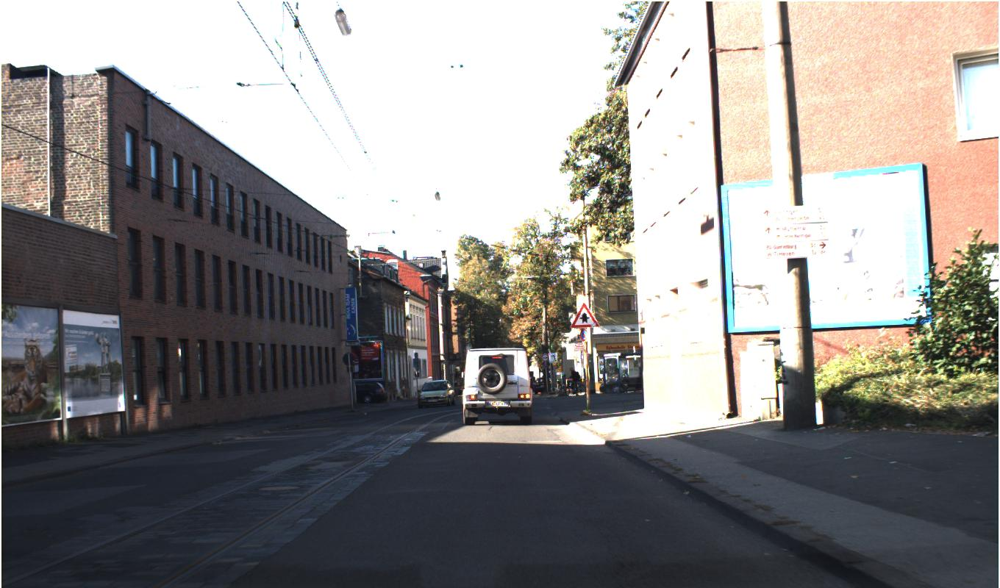

 The image with the result is saved in: temp.jpg
1/1 [==============================] - 0s 193ms/step


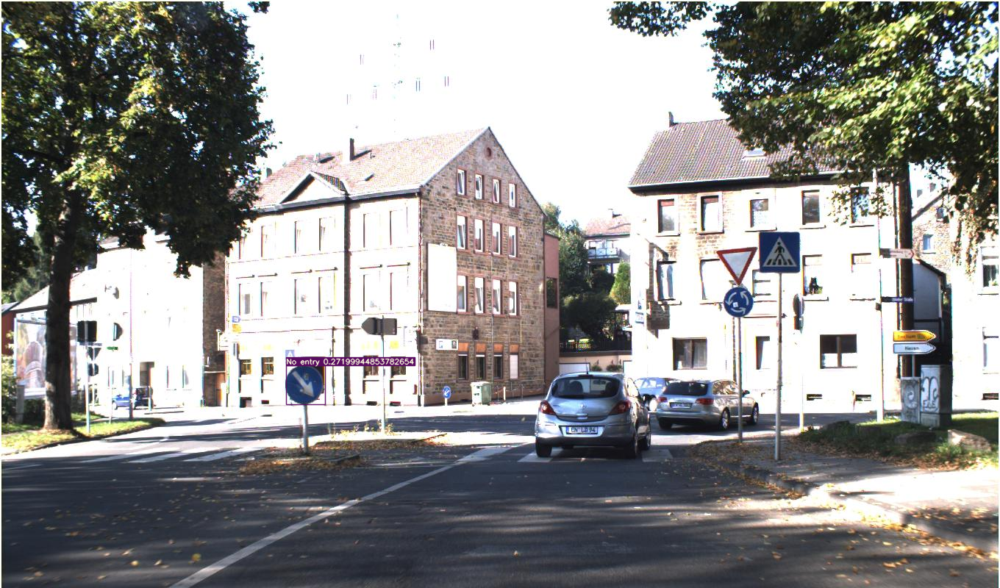

 The image with the result is saved in: traffic_sign_detection_cv/yolov7_demo/00001.jpg
1/1 [==============================] - 0s 26ms/step


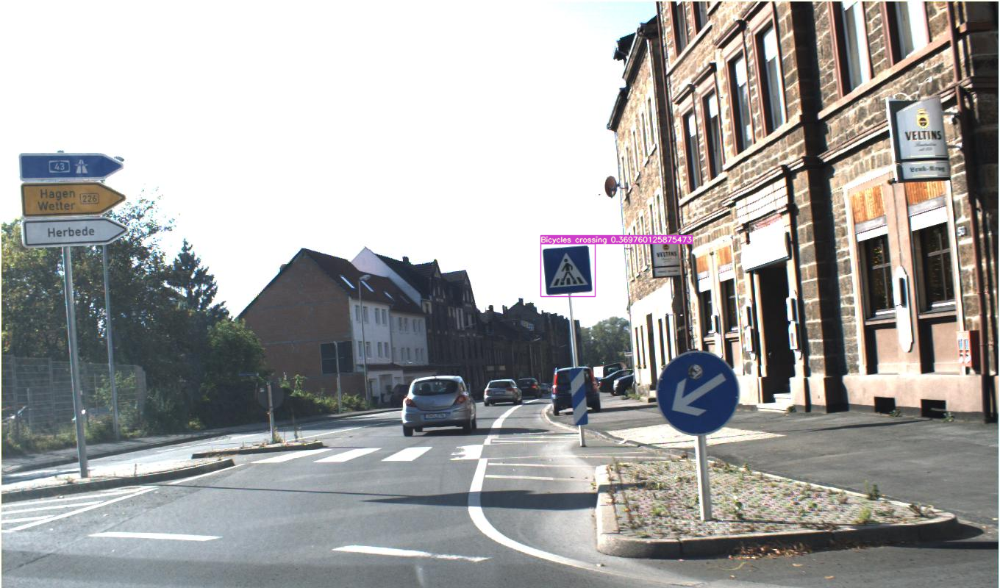

 The image with the result is saved in: traffic_sign_detection_cv/yolov7_demo/00002.jpg


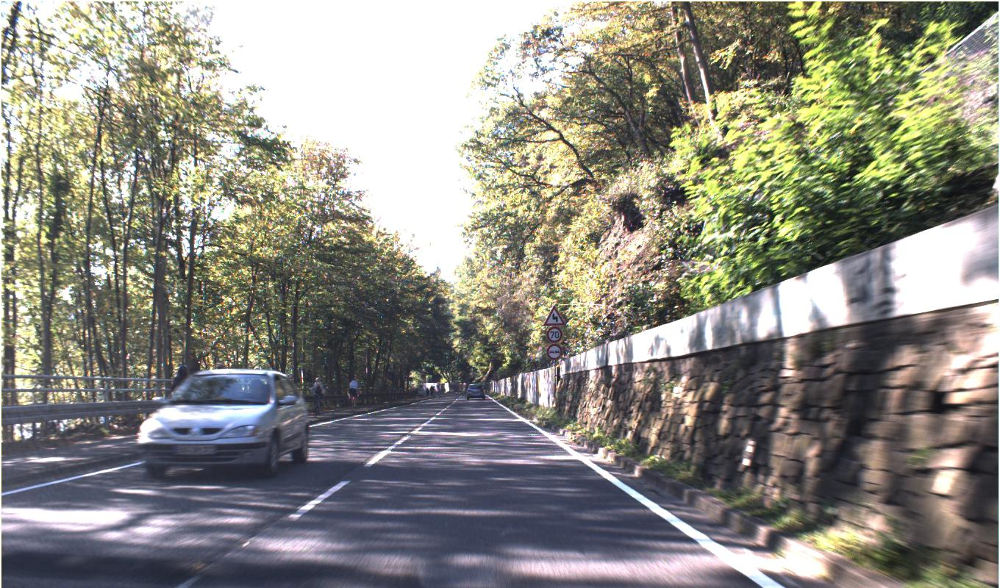

 The image with the result is saved in: traffic_sign_detection_cv/yolov7_demo/00002.jpg
1/1 [==============================] - 0s 31ms/step


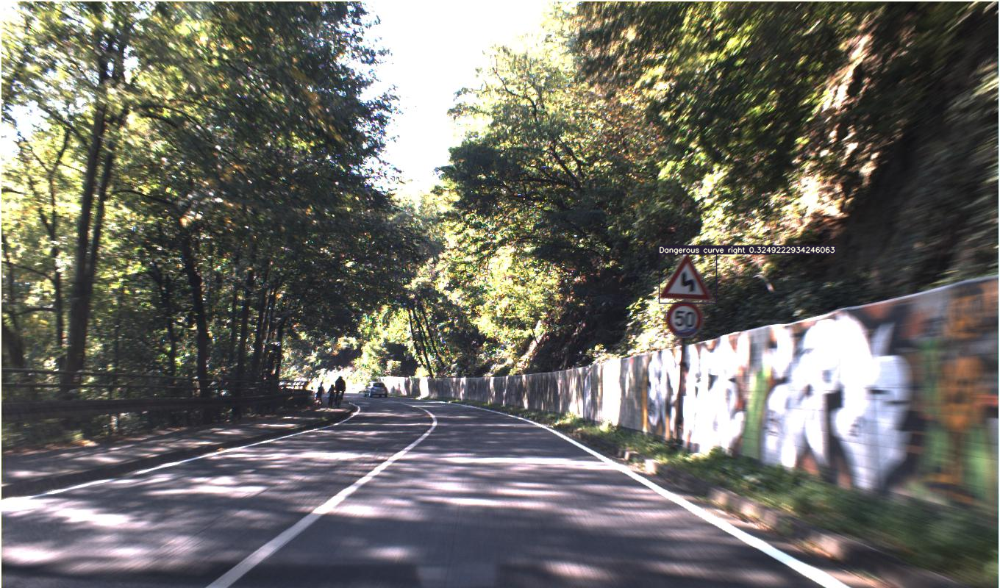

 The image with the result is saved in: traffic_sign_detection_cv/yolov7_demo/00004.jpg


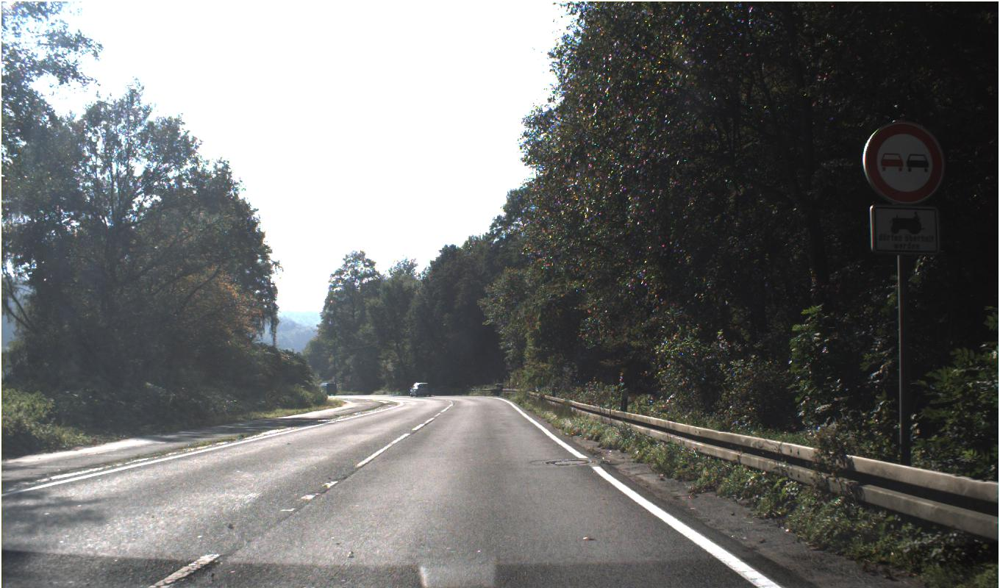

 The image with the result is saved in: traffic_sign_detection_cv/yolov7_demo/00004.jpg
1/1 [==============================] - 0s 37ms/step


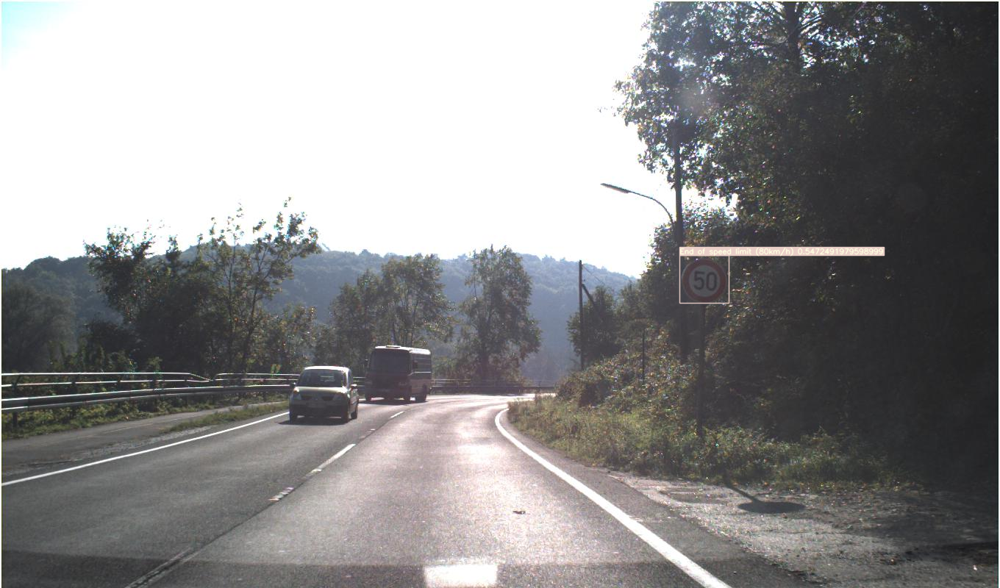

 The image with the result is saved in: traffic_sign_detection_cv/yolov7_demo/00006.jpg
1/1 [==============================] - 0s 26ms/step


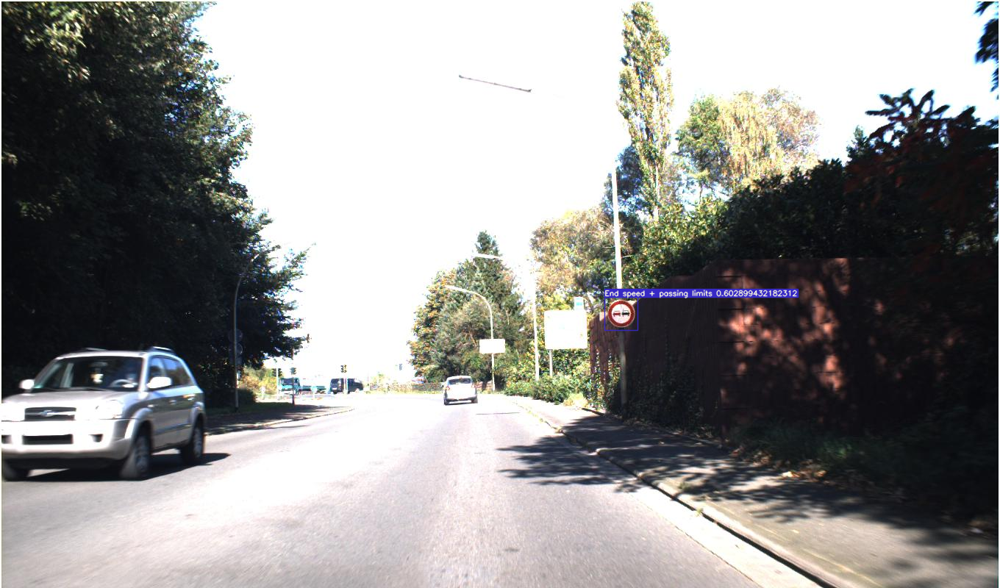

 The image with the result is saved in: traffic_sign_detection_cv/yolov7_demo/00007.jpg


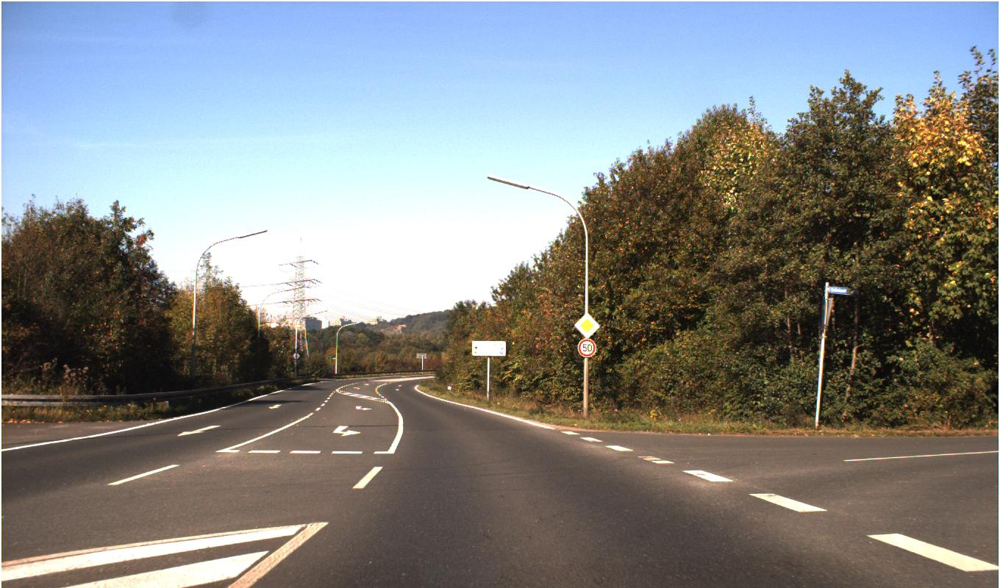

 The image with the result is saved in: traffic_sign_detection_cv/yolov7_demo/00007.jpg


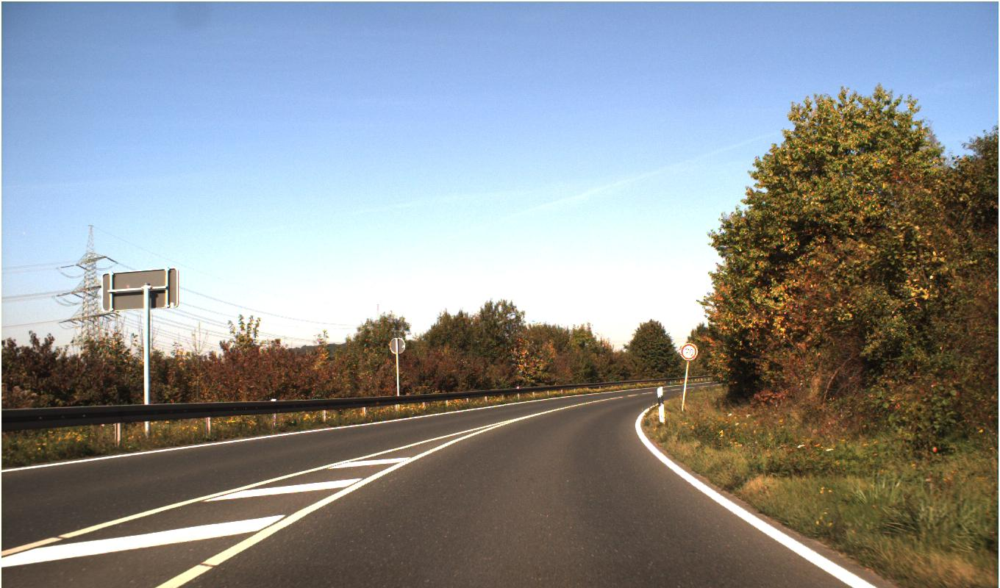

 The image with the result is saved in: traffic_sign_detection_cv/yolov7_demo/00007.jpg
Results saved to traffic_sign_detection_cv/yolov7_demo
78 labels saved to traffic_sign_detection_cv/yolov7_demo/labels
Done. (20.036s)


In [ ]:
detect(SOURCE_IMAGE, SOURCE_YOLO, save_img=True, source_weights_classifier=SOURCE_CLASSIFIER, classify=True, \
           view_img=True, save_txt=True, imgsz=1360, trace=False, exist_ok=True, device='cpu', classes=2, \
           augment=False, project="traffic_sign_detection_cv", name="yolov7_demo",  conf_thres=0.25, iou_thres=0.45,
           agnostic_nms=False, save_conf=True)

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

cap = cv2.VideoCapture("/content/traffic_sign_detection_cv/yolov7_demo/Autofahrt - 1686(1).mp4")
ret, frame = cap.read()
while(1):
   ret, frame = cap.read()
   cv2_imshow(frame)
   if cv2.waitKey(1) & 0xFF == ord('q') or ret==False :
       cap.release()
       cv2.destroyAllWindows()
       break
   cv2_imshow(frame)

AttributeError: ignored

In [ ]:
from IPython.display import HTML
from base64 import b64encode
 
def show_video(video_path, video_width = 1280):
   
  video_file = open(video_path, "r+b").read()
 
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")
 
show_video("/content/traffic_sign_detection_cv/yolov7_demo/Fahrt_test.mp4")

In [ ]:
SOURCE_VID = "Fahrt_test.mp4"
detect(SOURCE_VID, SOURCE_YOLO, save_img=True, source_weights_classifier=SOURCE_CLASSIFIER, classify=True, \
           view_img=False, save_txt=True, imgsz=1280, trace=False, exist_ok=True, device='cpu', classes=2, \
           augment=False, project="traffic_sign_detection_cv", name="yolov7_demo",  conf_thres=0.25, iou_thres=0.45,
           agnostic_nms=False, save_conf=True)

Adding autoShape... 
1/1 [==============================] - 0s 42ms/step
video 1/1 (353/506) /content/Fahrt_test.mp4: video 1/1 (354/506) /content/Fahrt_test.mp4: video 1/1 (355/506) /content/Fahrt_test.mp4: video 1/1 (356/506) /content/Fahrt_test.mp4: video 1/1 (357/506) /content/Fahrt_test.mp4: video 1/1 (358/506) /content/Fahrt_test.mp4: video 1/1 (359/506) /content/Fahrt_test.mp4: video 1/1 (360/506) /content/Fahrt_test.mp4: video 1/1 (361/506) /content/Fahrt_test.mp4: video 1/1 (362/506) /content/Fahrt_test.mp4: video 1/1 (363/506) /content/Fahrt_test.mp4: video 1/1 (364/506) /content/Fahrt_test.mp4: video 1/1 (365/506) /content/Fahrt_test.mp4: video 1/1 (366/506) /content/Fahrt_test.mp4: video 1/1 (367/506) /content/Fahrt_test.mp4: video 1/1 (368/506) /content/Fahrt_test.mp4: video 1/1 (369/506) /content/Fahrt_test.mp4: video 1/1 (370/506) /content/Fahrt_test.mp4: video 1/1 (371/506) /content/Fahrt_test.mp4: video 1/1 (372/506) /content/Fahrt_test.mp4: video 1/1 (373/506) /conten